In [ ]:
#ASSIGNMENT #1
#Rezwan-Ul-Alam (ID: 2011659042)
#Md. Nur Alam Jowel (ID: 2012355042)
#Raian Ruku (ID: 2013409642)

In [1]:
from google.colab import drive

In [2]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy

In [4]:
data = pd.read_excel('/content/gdrive/MyDrive/data/air.xlsx')
data.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.00,150,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,13.60,48.875001,0.757754
1,2004-03-10,19:00:00,2.0,1292.25,112,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,13.30,47.700000,0.725487
2,2004-03-10,20:00:00,2.2,1402.00,88,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,11.90,53.975000,0.750239
3,2004-03-10,21:00:00,2.2,1375.50,80,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,11.00,60.000000,0.786713
4,2004-03-10,22:00:00,1.6,1272.25,51,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,11.15,59.575001,0.788794


# Data PreProcessing

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       9357 non-null   int64         
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        9357 non-null   float64       
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        9357 non-null   float64       
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
dtypes: datetime64[ns](1),

In [6]:
data['NMHC(GT)'] = data['NMHC(GT)'].astype('float64')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         9357 non-null   float64       
 3   PT08.S1(CO)    9357 non-null   float64       
 4   NMHC(GT)       9357 non-null   float64       
 5   C6H6(GT)       9357 non-null   float64       
 6   PT08.S2(NMHC)  9357 non-null   float64       
 7   NOx(GT)        9357 non-null   float64       
 8   PT08.S3(NOx)   9357 non-null   float64       
 9   NO2(GT)        9357 non-null   float64       
 10  PT08.S4(NO2)   9357 non-null   float64       
 11  PT08.S5(O3)    9357 non-null   float64       
 12  T              9357 non-null   float64       
 13  RH             9357 non-null   float64       
 14  AH             9357 non-null   float64       
dtypes: datetime64[ns](1),

In [7]:
df = data.drop(['Date', 'Time','T','RH'], axis=1)
df.head()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),AH
0,2.6,1360.00,150.0,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,0.757754
1,2.0,1292.25,112.0,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,0.725487
2,2.2,1402.00,88.0,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,0.750239
3,2.2,1375.50,80.0,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,0.786713
4,1.6,1272.25,51.0,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,0.788794


In [8]:
for column in df.columns:
    total = df[column].isnull().sum()
    print(f"Column '{column}' has {total} null values")
    print("\n")

Column 'CO(GT)' has 0 null values


Column 'PT08.S1(CO)' has 0 null values


Column 'NMHC(GT)' has 0 null values


Column 'C6H6(GT)' has 0 null values


Column 'PT08.S2(NMHC)' has 0 null values


Column 'NOx(GT)' has 0 null values


Column 'PT08.S3(NOx)' has 0 null values


Column 'NO2(GT)' has 0 null values


Column 'PT08.S4(NO2)' has 0 null values


Column 'PT08.S5(O3)' has 0 null values


Column 'AH' has 0 null values




In [9]:
check = -200
#checking the presence of -200 in each of the columns
count = {}

for col in df.columns:
    count[col] = (df[col] == check).sum()

# Display the results
for column, count in count.items():
    print(f"Column '{column}' has {check}, {count} times")

Column 'CO(GT)' has -200, 1683 times
Column 'PT08.S1(CO)' has -200, 366 times
Column 'NMHC(GT)' has -200, 8443 times
Column 'C6H6(GT)' has -200, 366 times
Column 'PT08.S2(NMHC)' has -200, 366 times
Column 'NOx(GT)' has -200, 1639 times
Column 'PT08.S3(NOx)' has -200, 366 times
Column 'NO2(GT)' has -200, 1642 times
Column 'PT08.S4(NO2)' has -200, 366 times
Column 'PT08.S5(O3)' has -200, 366 times
Column 'AH' has -200, 366 times


In [10]:
df = df.drop('NMHC(GT)', axis=1) #90% value of this feature is missing, so drop it


In [11]:
df.replace(-200, np.nan, inplace=True)
df.isnull().sum()

CO(GT)           1683
PT08.S1(CO)       366
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
AH                366
dtype: int64

In [12]:
for col in df.columns:
    mean = df[col].astype(float).mean()
    df[col].replace(np.nan, mean, inplace=True)

In [13]:
df.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,2.152750,1099.707856,10.082993,939.029205,246.881252,835.370973,113.075515,1456.143486,1022.780725,1.025530
std,1.316068,212.796116,7.302474,261.557856,193.419417,251.741784,43.911095,339.365351,390.609000,0.395836
min,0.100000,647.250000,0.149048,383.250000,2.000000,322.000000,2.000000,551.000000,221.000000,0.184679
25%,1.200000,941.250000,4.591495,742.500000,112.000000,665.500000,85.900000,1241.500000,741.750000,0.746115
50%,2.152750,1074.500000,8.593367,923.250000,229.000000,817.500000,113.075515,1456.143486,982.500000,1.015441
75%,2.600000,1221.250000,13.636091,1104.750000,284.200000,960.250000,133.000000,1662.000000,1255.250000,1.296223
max,11.900000,2039.750000,63.741476,2214.000000,1479.000000,2682.750000,339.700000,2775.000000,2522.750000,2.231036


In [14]:
df_copy = df.copy()
df1 = np.array(df_copy)
df1.shape

(9357, 10)

# Train Test Split

In [15]:
import math
first_75 = math.ceil(0.75*len(df1))
print(first_75)

7018


In [16]:
data_train = df1[:first_75, :] #first 75% of the data
data_test = df1[first_75:, :] #last 25% of the data
print(f"Shape of training data{data_train.shape}\n")
print(f"Shape of training data{data_test.shape}")

Shape of training data(7018, 10)

Shape of training data(2339, 10)


In [17]:
x_train = data_train[:, :-1]  # First 10 columns
y_train = data_train[:, -1]   # Last column
x_test = data_test[:, :-1]  # First 10 columns
y_test = data_test[:, -1]   # Last column
print(x_train.shape)
print(y_train)
print(x_test.shape)
print(y_test)

(7018, 9)
[0.75775383 0.72548745 0.75023907 ... 0.86006183 0.83227527 0.83434514]
(2339, 9)
[0.83968237 0.8020108  0.8137702  ... 0.64064877 0.51386592 0.50280371]


# Cost,Grad Des, grad compute

In [18]:
def compute_cost(X, y, w, b):

    m = X.shape[0] # Here X is a metrix(not vector) with m example and n features.
    cost = 0.0

    for i in range(m):
        f_wb = np.dot(X[i], w) + b    # w is a vector in this case, not scalar. So, we use np.dot() for product
        cost = cost + (f_wb - y[i])**2
    total_cost = 1 / (2 * m) * cost

    return total_cost


def compute_gradient(X, y, w, b):
    """
    Computes the gradient for linear regression
    Args:
      X (ndarray (m,n)): m number of examples, n number of features
      y (ndarray (m,)) : target values
      w (ndarray (n,)) : model parameters
      b (scalar)       : model parameter

    Returns:
      dj_dw (ndarray (n,)): The gradient of the cost w.r.t. the parameters w.
      dj_db (scalar):       The gradient of the cost w.r.t. the parameter b.
    """
    m = X.shape[0] # number of examples
    n = X.shape[1] # number of features
    dj_dw = np.zeros((n,)) # array of zeroes with size = n(total number of feature)
    dj_db = 0.

    for i in range(m):
        f_wb = np.dot(X[i], w) + b
        common = f_wb - y[i]
        for j in range(n):
            dj_dw[j] = dj_dw[j] + common * X[i, j]
        dj_db = dj_db + common
    dj_dw = dj_dw / m
    dj_db = dj_db / m

    return dj_db, dj_dw

In [19]:
def gradient_descent(X, y, w_in, b_in,  alpha, num_iters, cost_function, gradient_function):
    """
    Performs gradient descent to fit w,b. Updates w,b by taking
    num_iters gradient steps with learning rate alpha

    Args:
      X (ndarray (m,n))  : m examples, n features
      y (ndarray (m,))  : target values
      w_in (ndarray(n,)) : initial values of model parameters
      b_in (scalar): initial values of model parameters
      alpha (float):     Learning rate
      num_iters (int):   number of iterations to run gradient descent
      cost_function:     function to call to produce cost
      gradient_function: function to call to produce gradient

    Returns:
      w (scalar): Updated value of parameter after running gradient descent
      b (scalar): Updated value of parameter after running gradient descent
      J_history (List): History of cost values
      p_history (list): History of parameters [w,b]
      """

    # An array to store cost J and w's at each iteration primarily for graphing later
    J_history = []
    w = copy.deepcopy(w_in) # avoid modifying global w_in
    p_history = []
    b = b_in
    #w = w_in

    for i in range(num_iters):
        # Calculate the gradient and update the parameters using gradient_function
        dj_db, dj_dw = gradient_function(X, y, w , b)

        # Update Parameters using equation (3) above
        w = w - alpha * dj_dw
        b = b - alpha * dj_db

        # Save cost J at each iteration
        if i<100000:      # prevent resource exhaustion
            J_history.append( cost_function(X, y, w , b))
            p_history.append([w,b])
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i% math.ceil(num_iters/10) == 0:
          print(f"Iteration {i:4}: Cost {J_history[-1]:8.2f} ",
                  f"dj_dw: {dj_dw}, dj_db: {dj_db: 0.3e}  ",
                  f"w: {w}, b:{b: 0.5e}")

    return w, b, J_history,p_history #return w and J,w history for graphing

# 1.0e-7

In [20]:
# initialize parameters

w_init =  np.array([0,0,0,0,0,0,0,0,0])

b_init = 0.
# some gradient descent settings
iterations = 1000
tmp_alpha = 1.0e-7 #7,8,9,10 ; 9 giving a better result
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(x_train ,y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"(w,b) found by gradient descent (alpha = {tmp_alpha:.1e}): ({w_final},{b_final:8.4f})")




Iteration    0: Cost     0.15  dj_dw: [   -2.49090091 -1263.93196763   -12.44697413 -1109.56003473
  -251.96851116  -944.66541284  -116.56818188 -1827.47018324
 -1170.09326067], dj_db: -1.143e+00   w: [2.49090091e-07 1.26393197e-04 1.24469741e-06 1.10956003e-04
 2.51968511e-05 9.44665413e-05 1.16568182e-05 1.82747018e-04
 1.17009326e-04], b: 1.14278e-07
Iteration  100: Cost     0.05  dj_dw: [  0.08369106   4.03251749   0.47470547   9.46450812   5.61976467
   4.75147073   2.78309034 -21.37540553  13.53833794], dj_db: -9.739e-03   w: [-7.21403548e-07  1.39468749e-04 -4.34097359e-06  4.49481938e-05
 -6.92442026e-05  1.89493390e-04 -1.64395855e-05  5.36321071e-04
 -4.14774991e-05], b: 3.11181e-07
Iteration  200: Cost     0.05  dj_dw: [  0.06656137   2.74880341   0.41120342   7.97198099   1.04434353
   6.45773774   2.12463039 -15.5537572    7.417943  ], dj_db: -8.776e-03   w: [-1.45485463e-06  1.06329128e-04 -8.66978142e-06 -4.03178287e-05
 -9.92149014e-05  1.26941463e-04 -4.05770372e-05  7

In [21]:
for i in range(5):
  print(f"alpha: {tmp_alpha:.1e}, target value: {y_test[i]:0.2f}, predicted value: {np.dot(x_test[i], w_final) + b_final:0.2f}")

alpha: 1.0e-07, target value: 0.84, predicted value: 0.77
alpha: 1.0e-07, target value: 0.80, predicted value: 0.77
alpha: 1.0e-07, target value: 0.81, predicted value: 0.77
alpha: 1.0e-07, target value: 0.88, predicted value: 0.82
alpha: 1.0e-07, target value: 0.90, predicted value: 0.94


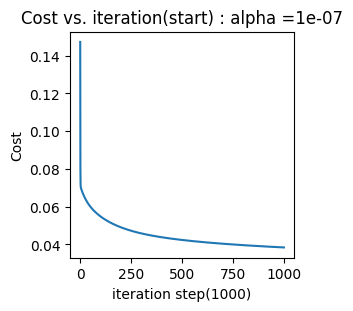

In [22]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start) : alpha ={tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

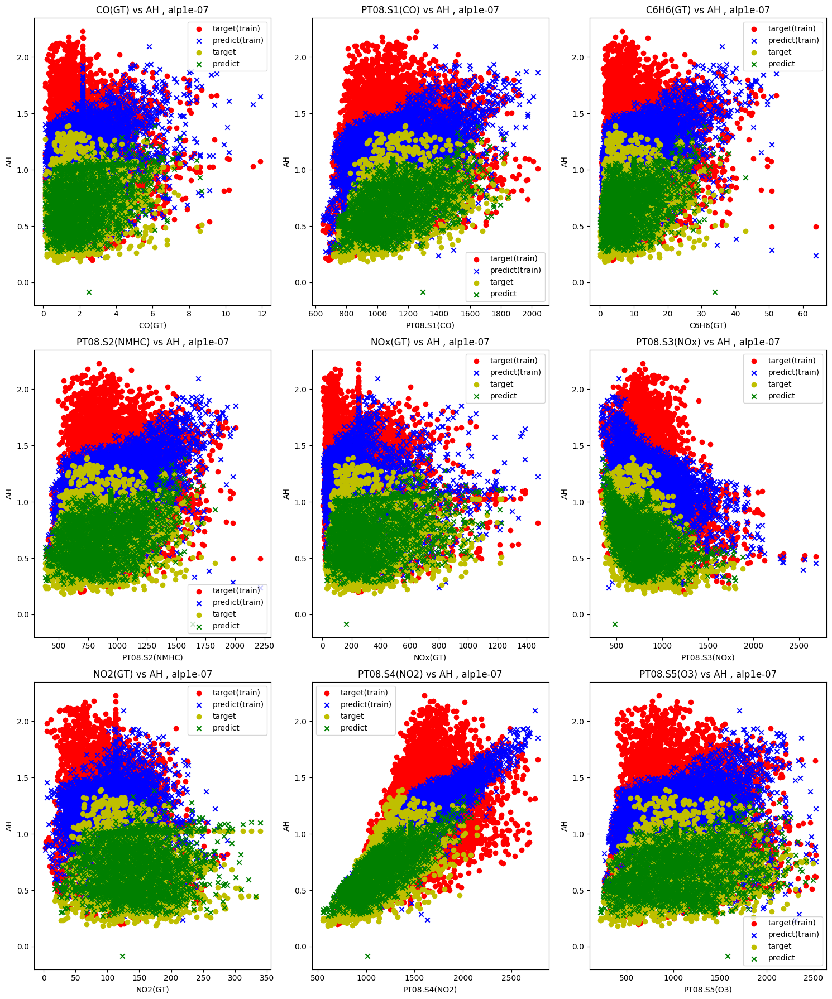

In [23]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(x_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(x_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(x_train[:, i], y_train, c='r', label='target(train)')
    axes[i].scatter(x_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(x_test[:, i], y_test, c='y', label='target')
    axes[i].scatter(x_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH , alp{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# 1.0e-8

In [105]:
iterations = 1000
tmp_alpha = 1.0e-8 #7,8,9,10 ; 9 giving a better result
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(x_train ,y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"(w,b) found by gradient descent (alpha = {tmp_alpha:.1e}): ({w_final},{b_final:8.4f})")


Iteration    0: Cost     0.64  dj_dw: [   -2.49090091 -1263.93196763   -12.44697413 -1109.56003473
  -251.96851116  -944.66541284  -116.56818188 -1827.47018324
 -1170.09326067], dj_db: -1.143e+00   w: [2.49090091e-08 1.26393197e-05 1.24469741e-07 1.10956003e-05
 2.51968511e-06 9.44665413e-06 1.16568182e-06 1.82747018e-05
 1.17009326e-05], b: 1.14278e-08
Iteration  100: Cost     0.07  dj_dw: [  0.14140482   5.33500801   0.81716265  15.15713263  16.4811298
 -19.09799776   4.02115913 -32.53875845  31.18399641], dj_db: -2.081e-02   w: [2.50134416e-07 1.86222013e-04 1.14785888e-06 1.54052020e-04
 2.31351838e-05 1.61286009e-04 1.40697307e-05 3.04603084e-04
 1.48560227e-04], b: 1.91454e-07
Iteration  200: Cost     0.07  dj_dw: [  0.13246605   6.28958648   0.75620125  14.97123307  14.80389952
 -12.9028266    3.92477554 -29.17625133  28.89215563], dj_db: -1.736e-02   w: [1.12365990e-07 1.79907145e-04 3.57408713e-07 1.38565145e-04
 7.41764217e-06 1.76802091e-04 1.00518818e-05 3.34723131e-04
 1.1

In [106]:
for i in range(5):
  print(f"alpha: {tmp_alpha:.1e}, target value: {y_test[i]:0.2f}, predicted value: {np.dot(x_test[i], w_final) + b_final:0.2f}")

alpha: 1.0e-08, target value: 0.84, predicted value: 0.86
alpha: 1.0e-08, target value: 0.80, predicted value: 0.86
alpha: 1.0e-08, target value: 0.81, predicted value: 0.86
alpha: 1.0e-08, target value: 0.88, predicted value: 0.94
alpha: 1.0e-08, target value: 0.90, predicted value: 1.09


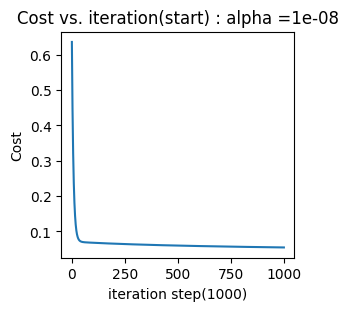

In [107]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start) : alpha ={tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

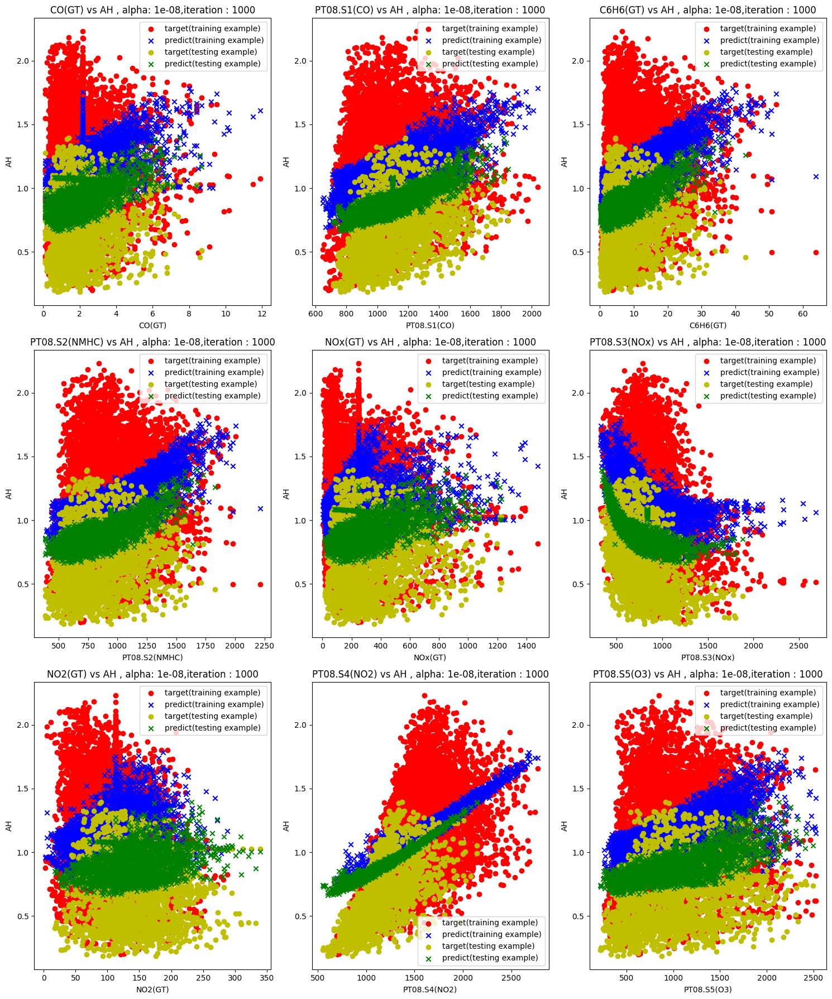

In [108]:

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(x_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(x_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(x_train[:, i], y_train, c='r', label='target(training example)')
    axes[i].scatter(x_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(training example)')

    # Scatter plot for test set
    axes[i].scatter(x_test[:, i], y_test, c='y', label='target(testing example)')
    axes[i].scatter(x_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict(testing example)')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH , alpha: {tmp_alpha},iteration : {iterations}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# 1.0e-8, iteration 3000

In [109]:
iterations = 3000
tmp_alpha = 1.0e-8 #7,8,9,10 ; 9 giving a better result
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(x_train ,y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"(w,b) found by gradient descent (alpha = {tmp_alpha:.1e}): ({w_final},{b_final:8.4f})")


Iteration    0: Cost     0.64  dj_dw: [   -2.49090091 -1263.93196763   -12.44697413 -1109.56003473
  -251.96851116  -944.66541284  -116.56818188 -1827.47018324
 -1170.09326067], dj_db: -1.143e+00   w: [2.49090091e-08 1.26393197e-05 1.24469741e-07 1.10956003e-05
 2.51968511e-06 9.44665413e-06 1.16568182e-06 1.82747018e-05
 1.17009326e-05], b: 1.14278e-08
Iteration  300: Cost     0.06  dj_dw: [  0.12243987   5.88242008   0.69361895  13.7734377   13.08657812
  -8.70868682   3.72103546 -27.93207768  25.80707865], dj_db: -1.558e-02   w: [-1.48961268e-08  1.73827053e-04 -3.66188627e-07  1.24217020e-04
 -6.49911311e-06  1.87513066e-04  6.23206463e-06  3.63261548e-04
  9.08139366e-05], b: 2.26472e-07
Iteration  600: Cost     0.06  dj_dw: [  0.10068285   4.92023875   0.56440772  11.26680949   9.12409291
  -0.3911168    3.23639311 -24.7444806   19.01879231], dj_db: -1.201e-02   w: [-3.46802584e-07  1.57713474e-04 -2.23395208e-06  8.70162644e-05
 -3.94095782e-05  1.99770220e-04 -4.16028000e-06  4

In [110]:
for i in range(5):
  print(f"alpha: {tmp_alpha:.1e}, target value: {y_test[i]:0.2f}, predicted value: {np.dot(x_test[i], w_final) + b_final:0.2f}")

alpha: 1.0e-08, target value: 0.84, predicted value: 0.80
alpha: 1.0e-08, target value: 0.80, predicted value: 0.80
alpha: 1.0e-08, target value: 0.81, predicted value: 0.81
alpha: 1.0e-08, target value: 0.88, predicted value: 0.88
alpha: 1.0e-08, target value: 0.90, predicted value: 1.03


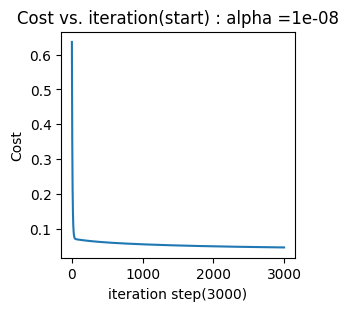

In [111]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start) : alpha ={tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

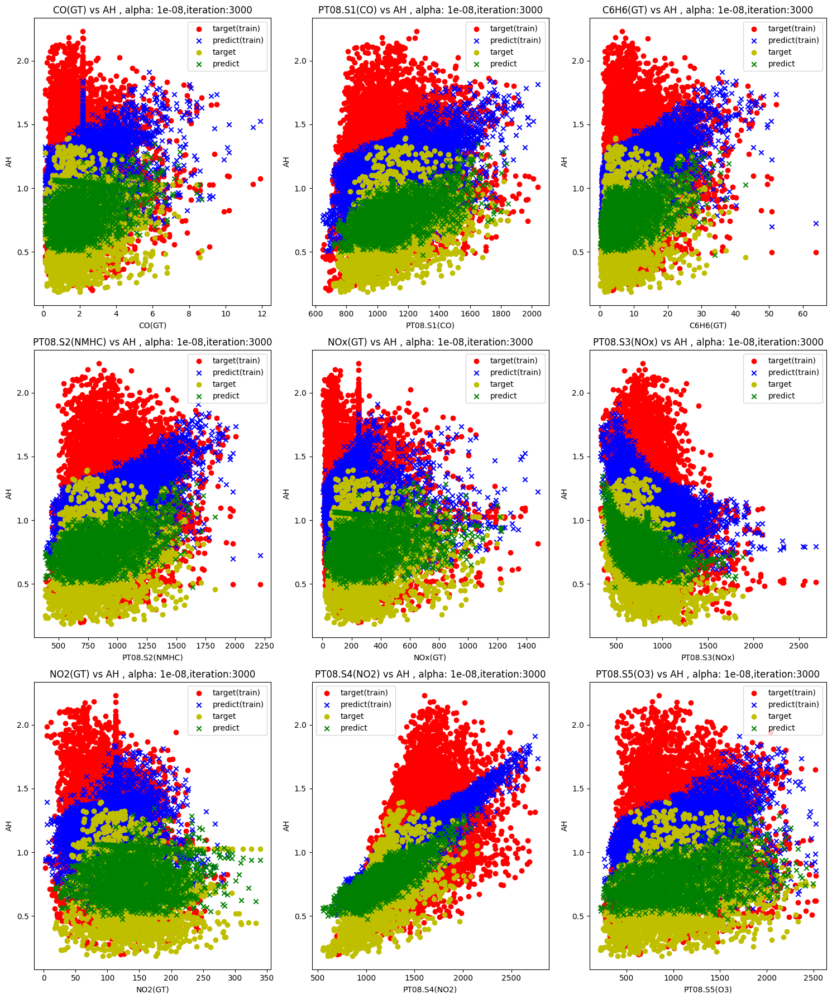

In [113]:

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(x_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(x_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(x_train[:, i], y_train, c='r', label='target(train)')
    axes[i].scatter(x_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(x_test[:, i], y_test, c='y', label='target')
    axes[i].scatter(x_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH , alpha: {tmp_alpha},iteration:{iterations}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# 1.0e-9

In [91]:
iterations = 1000
tmp_alpha = 1.0e-9 #7,8,9,10 ; 9 giving a better result
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(x_train ,y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"(w,b) found by gradient descent (alpha = {tmp_alpha:.1e}): ({w_final},{b_final:8.4f})")


Iteration    0: Cost     0.71  dj_dw: [   -2.49090091 -1263.93196763   -12.44697413 -1109.56003473
  -251.96851116  -944.66541284  -116.56818188 -1827.47018324
 -1170.09326067], dj_db: -1.143e+00   w: [2.49090091e-09 1.26393197e-06 1.24469741e-08 1.10956003e-06
 2.51968511e-07 9.44665413e-07 1.16568182e-07 1.82747018e-06
 1.17009326e-06], b: 1.14278e-09
Iteration  100: Cost     0.24  dj_dw: [  -1.21361975 -650.4012903    -6.00308345 -565.42561549 -121.3862941
 -499.79078762  -58.19783748 -960.69564493 -588.00022086], dj_db: -6.016e-01   w: [1.80105883e-07 9.33282850e-05 8.96539977e-07 8.16189095e-05
 1.81411210e-05 7.05230524e-05 8.50727309e-06 1.36077169e-04
 8.56074269e-05], b: 8.51433e-08
Iteration  200: Cost     0.12  dj_dw: [  -0.55355991 -333.03254932   -2.67413265 -284.01867394  -53.94726354
 -269.32444439  -28.01451093 -512.21717946 -287.08452004], dj_db: -3.215e-01   w: [2.64527929e-07 1.40610558e-04 1.31053341e-06 1.22415080e-04
 2.65050866e-05 1.07610570e-04 1.26380781e-05 2

In [92]:
for i in range(5):
  print(f" target value: {y_test[i]:0.2f}, predicted value: {np.dot(x_test[i], w_final) + b_final:0.2f}")

 target value: 0.84, predicted value: 0.86
 target value: 0.80, predicted value: 0.80
 target value: 0.81, predicted value: 0.84
 target value: 0.88, predicted value: 0.98
 target value: 0.90, predicted value: 1.19


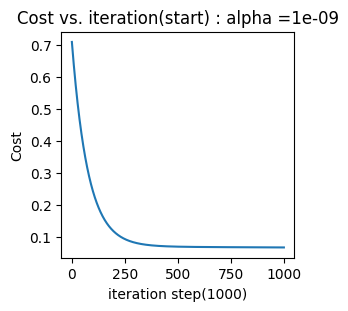

In [93]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start) : alpha ={tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

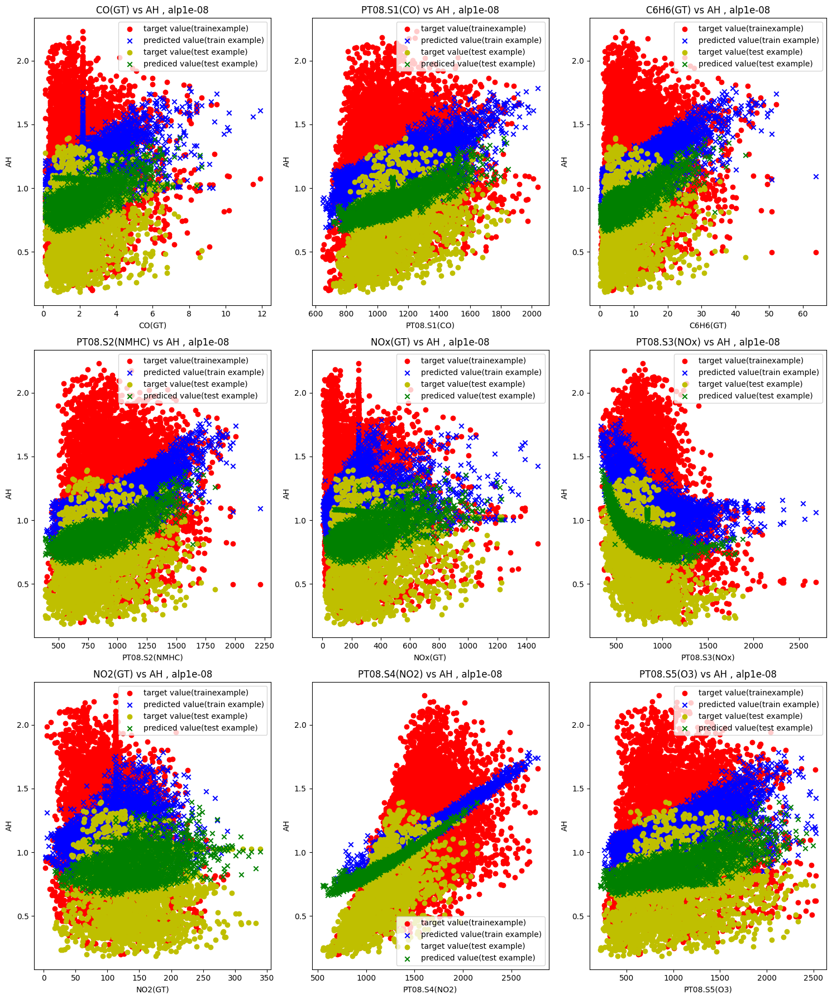

In [103]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(x_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(x_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(x_train[:, i], y_train, c='r', label='target value(trainexample)')
    axes[i].scatter(x_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predicted value(train example)')

    # Scatter plot for test set
    axes[i].scatter(x_test[:, i], y_test, c='y', label='target value(test example)')
    axes[i].scatter(x_test[:,i], tmp_f_wb_test, marker='x', c='g', label='prediced value(test example)')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH , alp{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# 1.0e-10

In [36]:
iterations = 1000
tmp_alpha = 1.0e-10 #7,8,9,10 ; 9 giving a better result
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(x_train ,y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"(w,b) found by gradient descent (alpha = {tmp_alpha:.1e}): ({w_final},{b_final:8.4f})")


Iteration    0: Cost     0.72  dj_dw: [   -2.49090091 -1263.93196763   -12.44697413 -1109.56003473
  -251.96851116  -944.66541284  -116.56818188 -1827.47018324
 -1170.09326067], dj_db: -1.143e+00   w: [2.49090091e-10 1.26393197e-07 1.24469741e-09 1.10956003e-07
 2.51968511e-08 9.44665413e-08 1.16568182e-08 1.82747018e-07
 1.17009326e-07], b: 1.14278e-10
Iteration  100: Cost     0.64  dj_dw: [   -2.3225501  -1183.08711762   -11.59757273 -1037.85522778
  -234.75447284  -886.06705523  -108.87602348 -1713.26279151
 -1093.37823272], dj_db: -1.071e+00   w: [2.42987019e-08 1.23530197e-05 1.21378402e-07 1.08405201e-05
 2.45700726e-06 9.24199434e-06 1.13807193e-06 1.78744493e-05
 1.14263283e-05], b: 1.11781e-08
Iteration  200: Cost     0.57  dj_dw: [   -2.164916   -1107.38439453   -10.80225595  -970.71206057
  -218.63678648  -831.19126759  -101.67326585 -1606.31806791
 -1021.5452119 ], dj_db: -1.005e+00   w: [4.67195118e-08 2.37974470e-05 2.33294181e-07 2.08763222e-05
 4.72227389e-06 1.78225413

In [37]:
for i in range(5):
  print(f"alpha: {tmp_alpha:.1e}, target value: {y_test[i]:0.2f}, predicted value: {np.dot(x_test[i], w_final) + b_final:0.2f}")

alpha: 1.0e-10, target value: 0.84, predicted value: 0.41
alpha: 1.0e-10, target value: 0.80, predicted value: 0.38
alpha: 1.0e-10, target value: 0.81, predicted value: 0.40
alpha: 1.0e-10, target value: 0.88, predicted value: 0.47
alpha: 1.0e-10, target value: 0.90, predicted value: 0.58


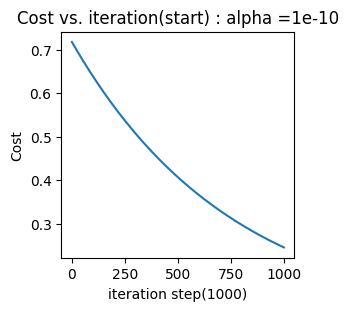

In [38]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start) : alpha ={tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

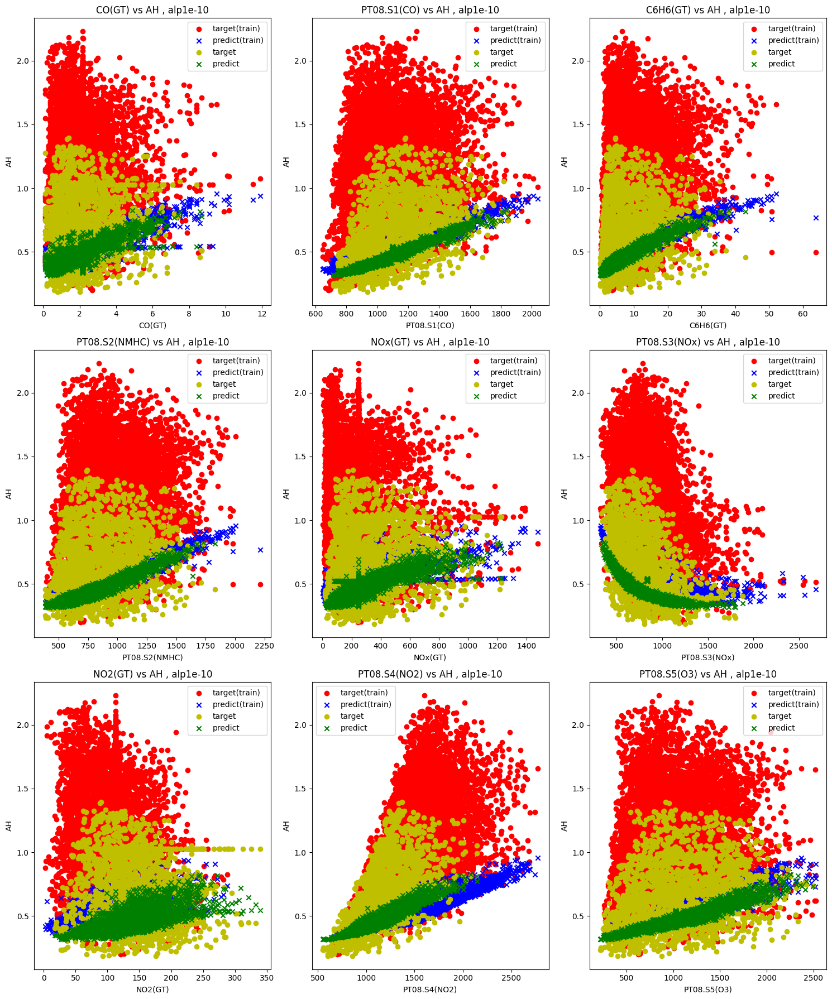

In [39]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(x_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(x_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(x_train[:, i], y_train, c='r', label='target(train)')
    axes[i].scatter(x_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(x_test[:, i], y_test, c='y', label='target')
    axes[i].scatter(x_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH , alp{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# 1.0e-3

In [40]:
iterations = 1000
tmp_alpha = 1.0e-3 #7,8,9,10 ; 9 giving a better result
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(x_train ,y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"(w,b) found by gradient descent (alpha = {tmp_alpha:.1e}): ({w_final},{b_final:8.4f})")


Iteration    0: Cost 27921433.28  dj_dw: [   -2.49090091 -1263.93196763   -12.44697413 -1109.56003473
  -251.96851116  -944.66541284  -116.56818188 -1827.47018324
 -1170.09326067], dj_db: -1.143e+00   w: [0.0024909  1.26393197 0.01244697 1.10956003 0.25196851 0.94466541
 0.11656818 1.82747018 1.17009326], b: 1.14278e-03


<ipython-input-18-d6907d2f2266>:8: RuntimeWarning: overflow encountered in scalar add
  cost = cost + (f_wb - y[i])**2
<ipython-input-18-d6907d2f2266>:8: RuntimeWarning: overflow encountered in scalar power
  cost = cost + (f_wb - y[i])**2
<ipython-input-18-d6907d2f2266>:36: RuntimeWarning: overflow encountered in scalar add
  dj_dw[j] = dj_dw[j] + common * X[i, j]
<ipython-input-19-eadb857757a7>:35: RuntimeWarning: invalid value encountered in subtract
  w = w - alpha * dj_dw


Iteration  100: Cost      nan  dj_dw: [nan nan nan nan nan nan nan nan nan], dj_db:  nan   w: [nan nan nan nan nan nan nan nan nan], b: nan
Iteration  200: Cost      nan  dj_dw: [nan nan nan nan nan nan nan nan nan], dj_db:  nan   w: [nan nan nan nan nan nan nan nan nan], b: nan
Iteration  300: Cost      nan  dj_dw: [nan nan nan nan nan nan nan nan nan], dj_db:  nan   w: [nan nan nan nan nan nan nan nan nan], b: nan
Iteration  400: Cost      nan  dj_dw: [nan nan nan nan nan nan nan nan nan], dj_db:  nan   w: [nan nan nan nan nan nan nan nan nan], b: nan
Iteration  500: Cost      nan  dj_dw: [nan nan nan nan nan nan nan nan nan], dj_db:  nan   w: [nan nan nan nan nan nan nan nan nan], b: nan
Iteration  600: Cost      nan  dj_dw: [nan nan nan nan nan nan nan nan nan], dj_db:  nan   w: [nan nan nan nan nan nan nan nan nan], b: nan
Iteration  700: Cost      nan  dj_dw: [nan nan nan nan nan nan nan nan nan], dj_db:  nan   w: [nan nan nan nan nan nan nan nan nan], b: nan
Iteration  800: Cost

In [41]:
for i in range(5):
  print(f"alpha: {tmp_alpha:.1e}, target value: {y_test[i]:0.2f}, predicted value: {np.dot(x_test[i], w_final) + b_final:0.2f}")

alpha: 1.0e-03, target value: 0.84, predicted value: nan
alpha: 1.0e-03, target value: 0.80, predicted value: nan
alpha: 1.0e-03, target value: 0.81, predicted value: nan
alpha: 1.0e-03, target value: 0.88, predicted value: nan
alpha: 1.0e-03, target value: 0.90, predicted value: nan


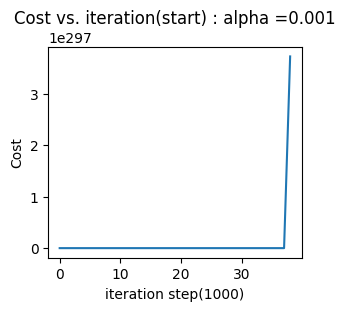

In [42]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start) : alpha ={tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

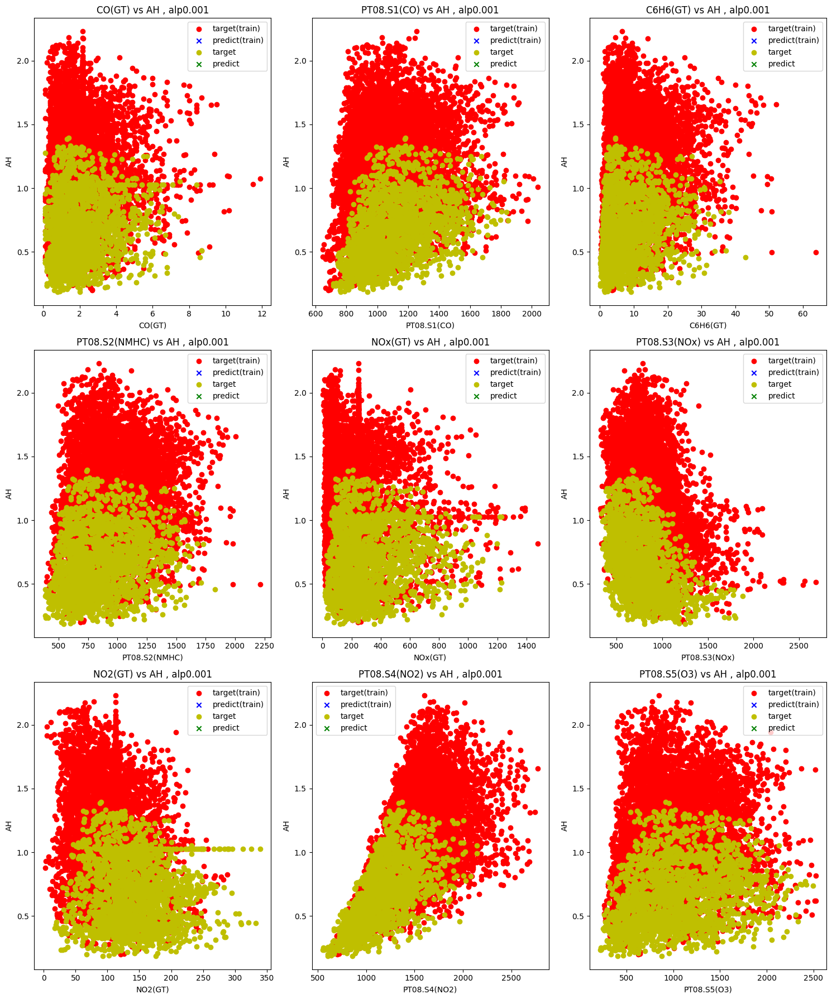

In [43]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(x_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(x_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(x_train[:, i], y_train, c='r', label='target(train)')
    axes[i].scatter(x_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(x_test[:, i], y_test, c='y', label='target')
    axes[i].scatter(x_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH , alp{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# Feature Scaling

In [53]:
df.head()


,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),AH
0,2.6,1360.00,11.881723,1045.50,166.0,1056.25,113.0,1692.00,1267.50,0.757754
1,2.0,1292.25,9.397165,954.75,103.0,1173.75,92.0,1558.75,972.25,0.725487
2,2.2,1402.00,8.997817,939.25,131.0,1140.00,114.0,1554.50,1074.00,0.750239
3,2.2,1375.50,9.228796,948.25,172.0,1092.00,122.0,1583.75,1203.25,0.786713
4,1.6,1272.25,6.518224,835.50,131.0,1205.00,116.0,1490.00,1110.00,0.788794


In [54]:
dfs = [df]
df2 = pd.concat(dfs, ignore_index=True)


In [55]:
def min_max_scaling(column):
    minimum_value = column.min()
    maximum_value = column.max()
    scaled_column = (column - minimum_value) / (maximum_value - minimum_value)
    return scaled_column

In [56]:
# Apply min-max scaling to each numeric column in the DataFrame
all_columns = df2.select_dtypes(include=[float, int]).columns
features_columns = all_columns[:-1]
print(features_columns)
df2[features_columns] = df2[features_columns].apply(min_max_scaling)
df2.head()

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)'],
      dtype='object')


,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),AH
0,0.211864,0.511849,0.184498,0.361737,0.111036,0.311024,0.328694,0.513040,0.454654,0.757754
1,0.161017,0.463196,0.145428,0.312167,0.068382,0.360796,0.266509,0.453125,0.326382,0.725487
2,0.177966,0.542011,0.139148,0.303701,0.087339,0.346500,0.331655,0.451214,0.370588,0.750239
3,0.177966,0.522980,0.142780,0.308617,0.115098,0.326168,0.355345,0.464366,0.426741,0.786713
4,0.127119,0.448833,0.100156,0.247030,0.087339,0.374034,0.337578,0.422212,0.386228,0.788794


In [57]:
df2.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,0.173962,0.324925,0.156213,0.303580,0.165796,0.217461,0.328918,0.406989,0.348335,1.025530
std,0.111531,0.152816,0.114832,0.142869,0.130954,0.106636,0.130030,0.152592,0.169701,0.395836
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.184679
25%,0.093220,0.211131,0.069858,0.196231,0.074475,0.145505,0.248445,0.310477,0.226241,0.746115
50%,0.173962,0.306822,0.132788,0.294961,0.153690,0.209891,0.328918,0.406989,0.330835,1.015441
75%,0.211864,0.412208,0.212086,0.394101,0.191063,0.270359,0.387918,0.499550,0.449332,1.296223
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.231036


In [58]:
df_cpy = df2.copy()
df3 = np.array(df_cpy)
df3.shape

(9357, 10)

# train test

In [59]:
first_75_df3 = math.ceil(0.75*len(df3))
print(first_75_df3)

7018


In [60]:
data_train_after_scaling = df3[:first_75_df3, :] #first 75% of the data
data_test_after_scaling = df3[first_75_df3:, :] #last 25% of the data
print(f"Shape of training data{data_train_after_scaling.shape}\n")
print(f"Shape of training data{data_test_after_scaling.shape}")

Shape of training data(7018, 10)

Shape of training data(2339, 10)


In [61]:
#after scaling
X_train = data_train_after_scaling[:, :-1]  # First 10 columns
Y_train = data_train_after_scaling[:, -1]   # Last column
X_test = data_test_after_scaling[:, :-1]  # First 10 columns
Y_test = data_test_after_scaling[:, -1]   # Last column
print(X_train.shape)
print(X_train)
print(X_test.shape)
print(X_test)

(7018, 9)
[[0.21186441 0.51184919 0.184498   ... 0.32869411 0.51303957 0.45465407]
 [0.16101695 0.46319569 0.14542796 ... 0.26650874 0.453125   0.3263821 ]
 [0.1779661  0.54201077 0.13914816 ... 0.33165532 0.45121403 0.3705876 ]
 ...
 [0.17396183 0.23070018 0.04653834 ... 0.32891772 0.23853417 0.20397524]
 [0.17396183 0.20915619 0.0437662  ... 0.32891772 0.23977068 0.1995221 ]
 [0.17396183 0.22549372 0.04539594 ... 0.32891772 0.23954586 0.23178017]]
(2339, 9)
[[0.17396183 0.19317774 0.03772457 ... 0.32891772 0.23077788 0.21896383]
 [0.17396183 0.13447038 0.01105782 ... 0.32891772 0.18435252 0.09156077]
 [0.17396183 0.17091562 0.02664388 ... 0.32891772 0.21571493 0.16965352]
 ...
 [0.19491525 0.35529623 0.19224758 ... 0.51140065 0.31013939 0.37840773]
 [0.16949153 0.2551167  0.14778707 ... 0.4551377  0.22032374 0.23840556]
 [0.1779661  0.30412926 0.18528954 ... 0.49067219 0.25966727 0.25849897]]


# tmp_alpha = 1.0e-3


In [62]:
# initialize parameters

w_init =  np.array([0,0,0,0,0,0,0,0,0])

b_init = 0.
# some gradient descent settings
iterations = 1000
tmp_alpha = 1.0e-3 #10
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(X_train ,Y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"\n alpha:{tmp_alpha}, (w,b) found by gradient descent: ({w_final},{b_final:8.4f})")




Iteration    0: Cost     0.72  dj_dw: [-0.20140876 -0.37649566 -0.19305201 -0.36683935 -0.16904737 -0.24428319
 -0.33841466 -0.53857941 -0.39862703], dj_db: -1.143e+00   w: [0.00020141 0.0003765  0.00019305 0.00036684 0.00016905 0.00024428
 0.00033841 0.00053858 0.00039863], b: 1.14278e-03
Iteration  100: Cost     0.52  dj_dw: [-0.16632758 -0.31285426 -0.15951711 -0.30483453 -0.1390873  -0.20487545
 -0.28056035 -0.45238055 -0.33087826], dj_db: -9.584e-01   w: [0.01851827 0.03471714 0.01775462 0.03382695 0.01551601 0.02262392
 0.0311719  0.04991493 0.03673885], b: 1.05833e-01
Iteration  200: Cost     0.39  dj_dw: [-0.13700917 -0.25966013 -0.13149282 -0.25300764 -0.11405164 -0.17190946
 -0.23219779 -0.38031482 -0.27425198], dj_db: -8.042e-01   w: [0.03362662 0.06323682 0.03224919 0.06161575 0.02812299 0.04139769
 0.05671345 0.09140618 0.06688246], b: 1.93652e-01
Iteration  300: Cost     0.29  dj_dw: [-0.11250876 -0.21520055 -0.10807568 -0.2096901  -0.09313304 -0.1443294
 -0.19177097 -0.3

In [63]:
for i in range(5):
    print(f" alpha:{tmp_alpha}, target value: {Y_test[i]:0.2f}, predicted value: {np.dot(X_test[i], w_final) + b_final:0.8f}")

 alpha:0.001, target value: 0.84, predicted value: 0.80507237
 alpha:0.001, target value: 0.80, predicted value: 0.76062155
 alpha:0.001, target value: 0.81, predicted value: 0.78901061
 alpha:0.001, target value: 0.88, predicted value: 0.87815518
 alpha:0.001, target value: 0.90, predicted value: 1.00374043


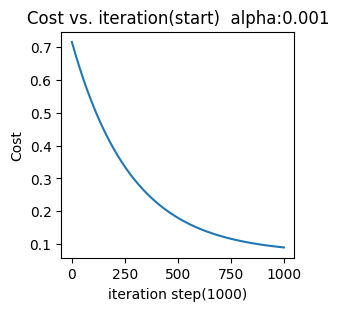

In [64]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start)  alpha:{tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

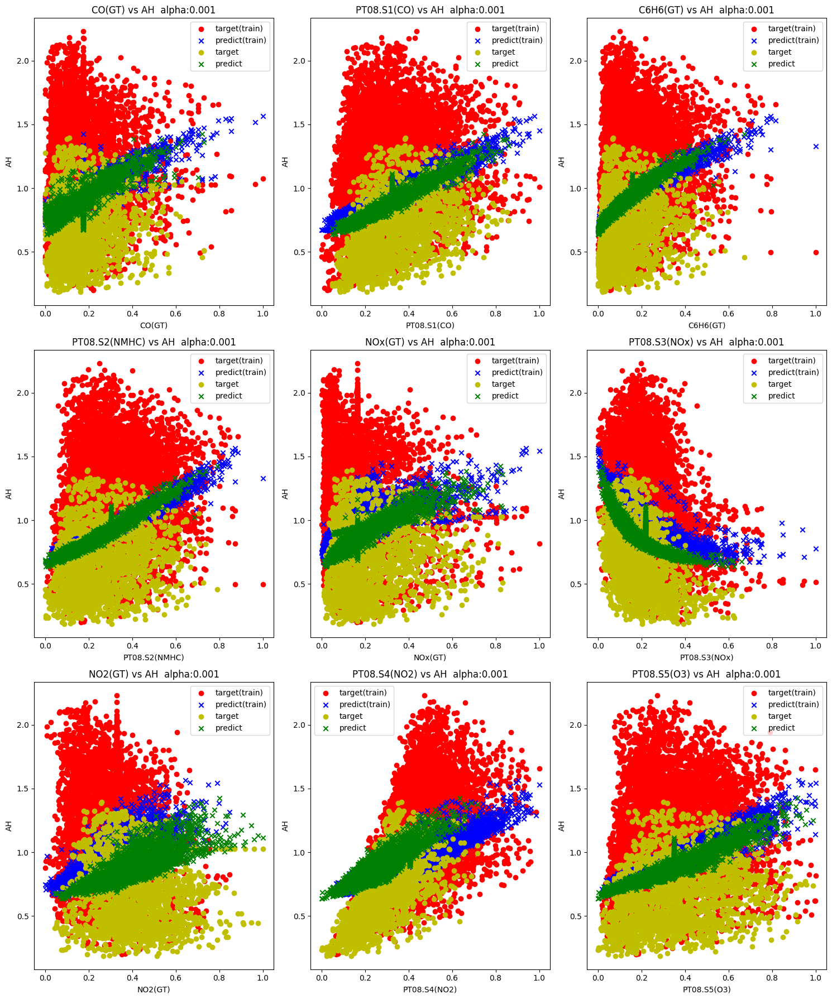

In [65]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(X_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(X_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(X_train[:, i], Y_train, c='r', label='target(train)')
    axes[i].scatter(X_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(X_test[:, i], Y_test, c='y', label='target')
    axes[i].scatter(X_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH  alpha:{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# tmp_alpha = 1.0e-7


In [66]:
# some gradient descent settings
iterations = 1000
tmp_alpha = 1.0e-7 #10
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(X_train ,Y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f"\nalpha:{tmp_alpha}, (w,b) found by gradient descent: ({w_final},{b_final:8.4f})")



Iteration    0: Cost     0.72  dj_dw: [-0.20140876 -0.37649566 -0.19305201 -0.36683935 -0.16904737 -0.24428319
 -0.33841466 -0.53857941 -0.39862703], dj_db: -1.143e+00   w: [2.01408755e-08 3.76495657e-08 1.93052006e-08 3.66839346e-08
 1.69047366e-08 2.44283190e-08 3.38414658e-08 5.38579410e-08
 3.98627029e-08], b: 1.14278e-07
Iteration  100: Cost     0.72  dj_dw: [-0.20140493 -0.37648871 -0.19304835 -0.36683258 -0.1690441  -0.24427889
 -0.33840834 -0.53857    -0.39861964], dj_db: -1.143e+00   w: [2.03420909e-06 3.80257106e-06 1.94980678e-06 3.70504322e-06
 1.70736188e-06 2.46723851e-06 3.41795616e-06 5.43960454e-06
 4.02609566e-06], b: 1.15419e-05
Iteration  200: Cost     0.72  dj_dw: [-0.2014011  -0.37648177 -0.19304469 -0.36682581 -0.16904083 -0.24427459
 -0.33840203 -0.5385606  -0.39861224], dj_db: -1.143e+00   w: [4.04823902e-06 7.56742310e-06 3.88027176e-06 7.37333485e-06
 3.39778632e-06 4.91000571e-06 6.80200772e-06 1.08252571e-05
 8.01225468e-06], b: 2.29694e-05
Iteration  300: 

In [67]:
for i in range(5):
    print(f" alpha:{tmp_alpha}, target value: {Y_test[i]:0.2f}, predicted value: {np.dot(X_test[i], w_final) + b_final:0.8f}")

 alpha:1e-07, target value: 0.84, predicted value: 0.00017228
 alpha:1e-07, target value: 0.80, predicted value: 0.00016233
 alpha:1e-07, target value: 0.81, predicted value: 0.00016867
 alpha:1e-07, target value: 0.88, predicted value: 0.00018844
 alpha:1e-07, target value: 0.90, predicted value: 0.00021617


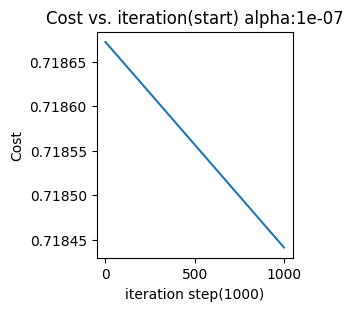

In [68]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start) alpha:{tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

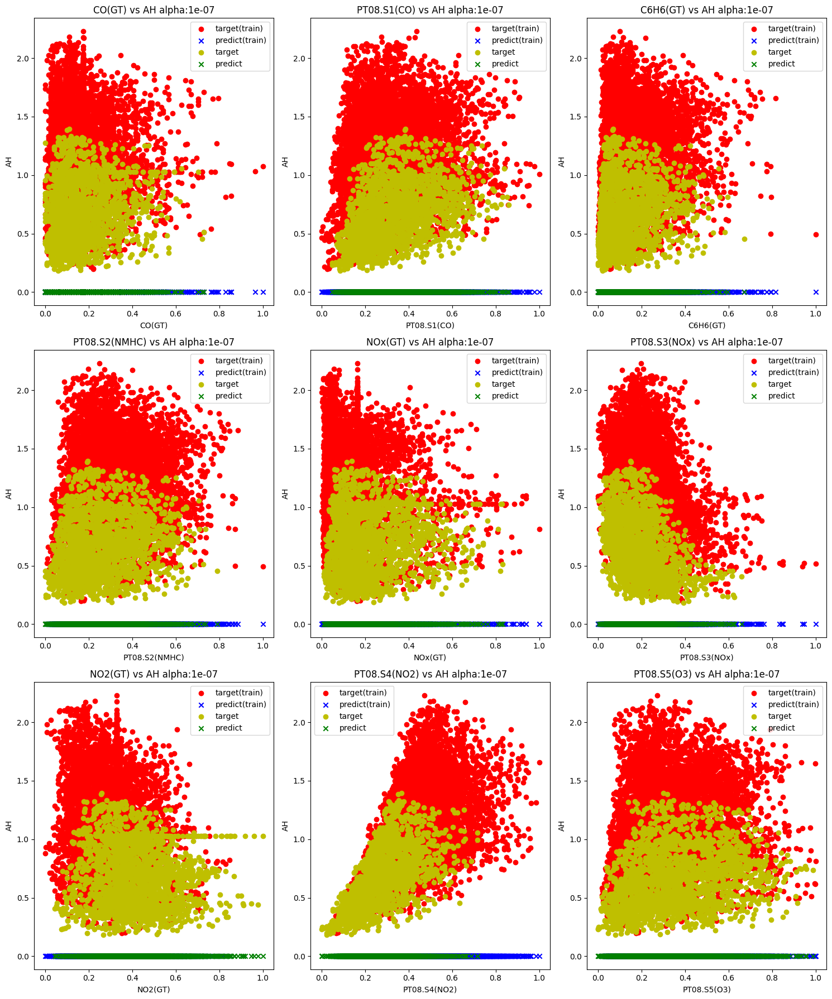

In [69]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(X_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(X_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(X_train[:, i], Y_train, c='r', label='target(train)')
    axes[i].scatter(X_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(X_test[:, i], Y_test, c='y', label='target')
    axes[i].scatter(X_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH alpha:{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# tmp_alpha = 1.0e-10


In [81]:
iterations = 1000
tmp_alpha = 1.0e-10 #10
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(X_train ,Y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f" \nalpha:{tmp_alpha}, (w,b) found by gradient descent: ({w_final},{b_final:8.4f})")


Iteration    0: Cost     0.72  dj_dw: [-0.20140876 -0.37649566 -0.19305201 -0.36683935 -0.16904737 -0.24428319
 -0.33841466 -0.53857941 -0.39862703], dj_db: -1.143e+00   w: [2.01408755e-11 3.76495657e-11 1.93052006e-11 3.66839346e-11
 1.69047366e-11 2.44283190e-11 3.38414658e-11 5.38579410e-11
 3.98627029e-11], b: 1.14278e-10
Iteration  100: Cost     0.72  dj_dw: [-0.20140875 -0.37649565 -0.193052   -0.36683934 -0.16904736 -0.24428319
 -0.33841465 -0.5385794  -0.39862702], dj_db: -1.143e+00   w: [2.03422841e-09 3.80260610e-09 1.94982525e-09 3.70507736e-09
 1.70737838e-09 2.46726020e-09 3.41798801e-09 5.43965199e-09
 4.02613296e-09], b: 1.15420e-08
Iteration  200: Cost     0.72  dj_dw: [-0.20140875 -0.37649564 -0.193052   -0.36683933 -0.16904736 -0.24428318
 -0.33841465 -0.53857939 -0.39862701], dj_db: -1.143e+00   w: [4.04831590e-09 7.56756256e-09 3.88034525e-09 7.37347072e-09
 3.39785199e-09 4.91009203e-09 6.80213449e-09 1.08254459e-08
 8.01240314e-09], b: 2.29698e-08
Iteration  300: 

In [82]:
for i in range(5):
    print(f" alpha:{tmp_alpha}, target value: {Y_test[i]:0.2f}, predicted value: {np.dot(X_test[i], w_final) + b_final:0.8f}")

 alpha:1e-10, target value: 0.84, predicted value: 0.00000017
 alpha:1e-10, target value: 0.80, predicted value: 0.00000016
 alpha:1e-10, target value: 0.81, predicted value: 0.00000017
 alpha:1e-10, target value: 0.88, predicted value: 0.00000019
 alpha:1e-10, target value: 0.90, predicted value: 0.00000022


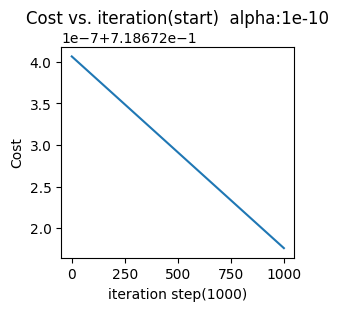

In [83]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start)  alpha:{tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

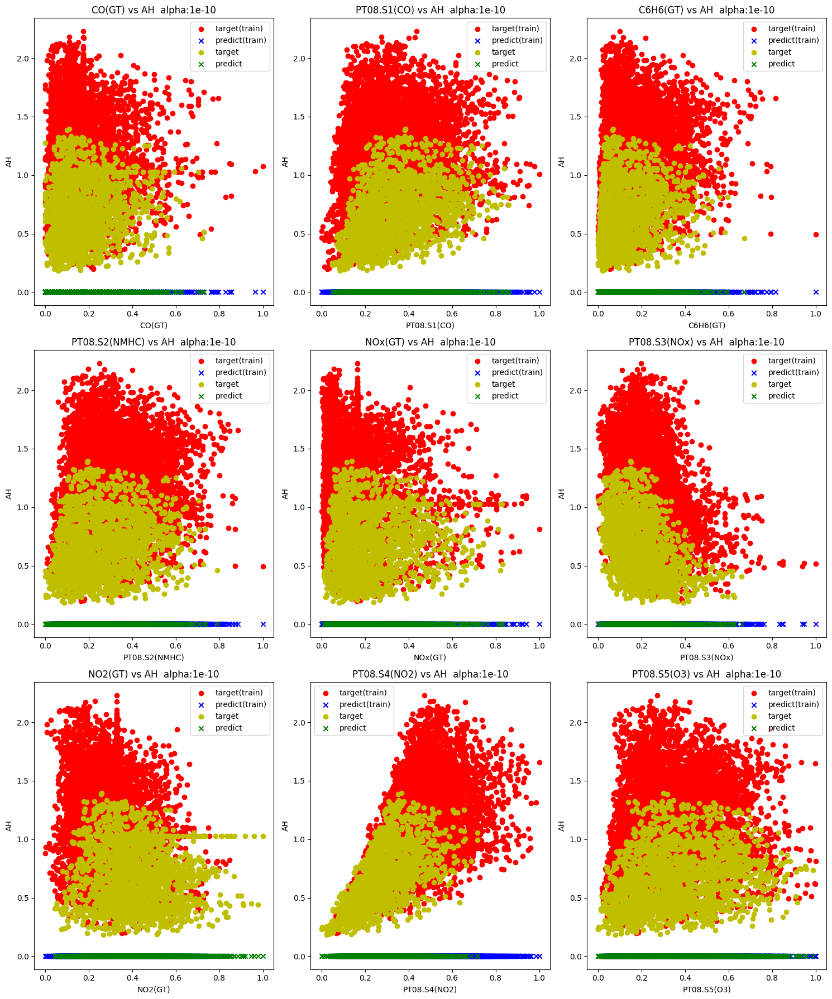

In [84]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(X_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(X_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(X_train[:, i], Y_train, c='r', label='target(train)')
    axes[i].scatter(X_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(X_test[:, i], Y_test, c='y', label='target')
    axes[i].scatter(X_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH  alpha:{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# 1.0e-5

In [85]:
iterations = 1000
tmp_alpha = 1.0e-5 #10
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(X_train ,Y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f" \nalpha:{tmp_alpha}, (w,b) found by gradient descent: ({w_final},{b_final:8.4f})")


Iteration    0: Cost     0.72  dj_dw: [-0.20140876 -0.37649566 -0.19305201 -0.36683935 -0.16904737 -0.24428319
 -0.33841466 -0.53857941 -0.39862703], dj_db: -1.143e+00   w: [2.01408755e-06 3.76495657e-06 1.93052006e-06 3.66839346e-06
 1.69047366e-06 2.44283190e-06 3.38414658e-06 5.38579410e-06
 3.98627029e-06], b: 1.14278e-05
Iteration  100: Cost     0.72  dj_dw: [-0.20102622 -0.37580173 -0.19268632 -0.36616326 -0.16872065 -0.24385365
 -0.33778386 -0.53763961 -0.39788831], dj_db: -1.141e+00   w: [0.00020323 0.00037991 0.0001948  0.00037017 0.00017057 0.00024651
 0.00034148 0.00054349 0.00040224], b: 1.15319e-03
Iteration  200: Cost     0.71  dj_dw: [-0.20064436 -0.37510904 -0.19232129 -0.36548839 -0.16839453 -0.24342487
 -0.33715419 -0.5367015  -0.39715091], dj_db: -1.139e+00   w: [0.00040406 0.00075536 0.0003873  0.00073599 0.00033913 0.00049015
 0.00067895 0.00108066 0.00079976], b: 2.29294e-03
Iteration  300: Cost     0.71  dj_dw: [-0.2002632  -0.37441759 -0.19195691 -0.36481473 -0.

In [86]:
for i in range(5):
    print(f" alpha:{tmp_alpha}, target value: {Y_test[i]:0.2f}, predicted value: {np.dot(X_test[i], w_final) + b_final:0.8f}")

 alpha:1e-05, target value: 0.84, predicted value: 0.01707674
 alpha:1e-05, target value: 0.80, predicted value: 0.01609128
 alpha:1e-05, target value: 0.81, predicted value: 0.01671938
 alpha:1e-05, target value: 0.88, predicted value: 0.01867885
 alpha:1e-05, target value: 0.90, predicted value: 0.02142650


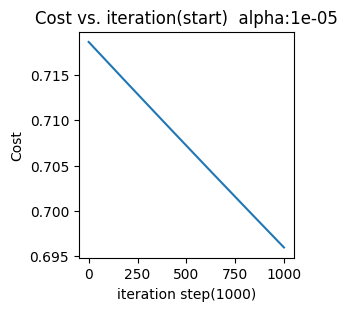

In [87]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start)  alpha:{tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

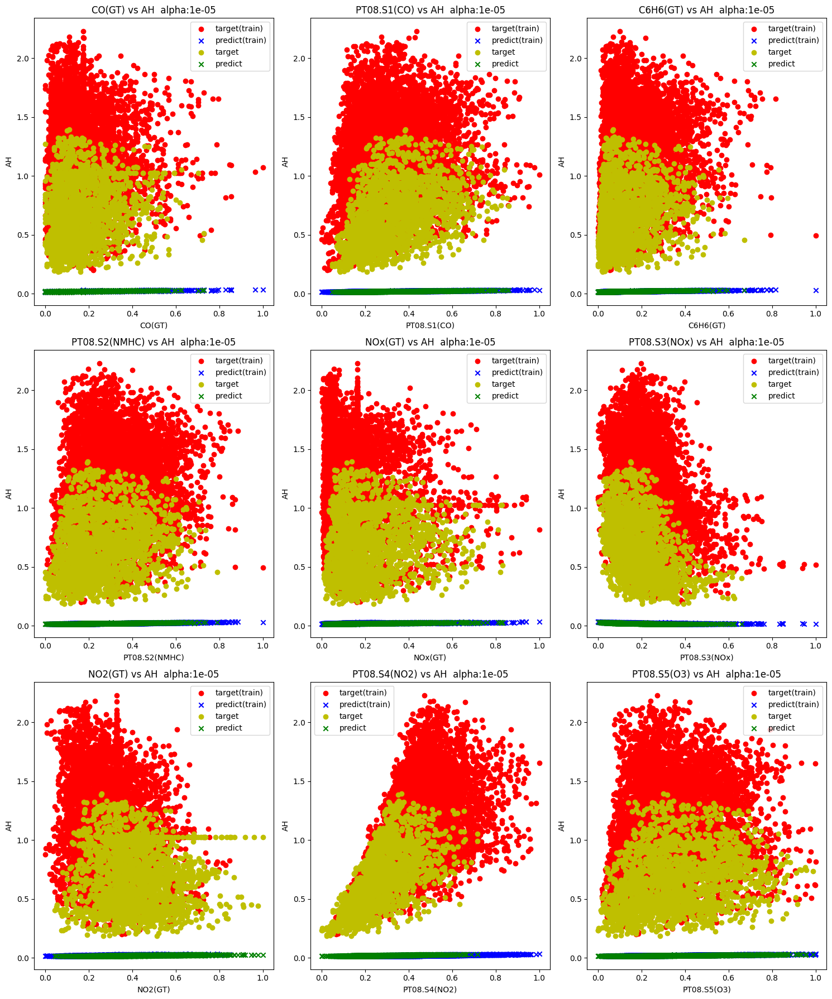

In [88]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(X_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(X_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(X_train[:, i], Y_train, c='r', label='target(train)')
    axes[i].scatter(X_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train)')

    # Scatter plot for test set
    axes[i].scatter(X_test[:, i], Y_test, c='y', label='target')
    axes[i].scatter(X_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH  alpha:{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


# 1.0e-1

In [114]:
iterations = 1000
tmp_alpha = 1.0e-1 #10
# run gradient descent
w_final, b_final, J_hist, p_hist = gradient_descent(X_train ,Y_train, w_init, b_init,tmp_alpha,
                                                    iterations,compute_cost, compute_gradient)
print(f" \nalpha:{tmp_alpha}, (w,b) found by gradient descent: ({w_final},{b_final:8.4f})")


Iteration    0: Cost     0.51  dj_dw: [-0.20140876 -0.37649566 -0.19305201 -0.36683935 -0.16904737 -0.24428319
 -0.33841466 -0.53857941 -0.39862703], dj_db: -1.143e+00   w: [0.02014088 0.03764957 0.0193052  0.03668393 0.01690474 0.02442832
 0.03384147 0.05385794 0.0398627 ], b: 1.14278e-01
Iteration  100: Cost     0.06  dj_dw: [ 0.00766078  0.00593945  0.00625807  0.00605324  0.00808873  0.00322691
  0.01106196 -0.01341629  0.00799105], dj_db: -8.846e-03   w: [ 0.01862929  0.12977503  0.02636663  0.12516217 -0.00691392  0.13510548
  0.06862544  0.4271351   0.1187152 ], b: 7.60601e-01
Iteration  200: Cost     0.06  dj_dw: [ 0.00506401  0.00330771  0.00384697  0.00366118  0.00474732  0.00629287
  0.00886794 -0.01297497  0.00475514], dj_db: -4.629e-03   w: [-0.04337053  0.08561478 -0.02228121  0.07852643 -0.06939387  0.08487451
 -0.03004859  0.55965163  0.05728773], b: 8.24817e-01
Iteration  300: Cost     0.05  dj_dw: [ 0.00371399  0.00225596  0.00286675  0.00274482  0.00272463  0.0073425

In [115]:
for i in range(5):
    print(f" alpha:{tmp_alpha}, target value: {Y_test[i]:0.2f}, predicted value: {np.dot(X_test[i], w_final) + b_final:0.8f}")

 alpha:0.1, target value: 0.84, predicted value: 0.89005771
 alpha:0.1, target value: 0.80, predicted value: 0.80270659
 alpha:0.1, target value: 0.81, predicted value: 0.85968090
 alpha:0.1, target value: 0.88, predicted value: 0.98406500
 alpha:0.1, target value: 0.90, predicted value: 1.12466400


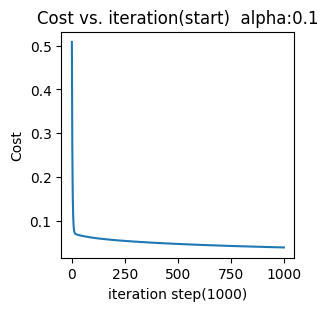

In [116]:
# plot cost versus iteration
fig, (ax1) = plt.subplots(1, 1, constrained_layout=True, figsize=(3,3))
ax1.plot(J_hist[:iterations])
ax1.set_title(f"Cost vs. iteration(start)  alpha:{tmp_alpha}");
ax1.set_ylabel('Cost')            ;
ax1.set_xlabel(f'iteration step({iterations})')  ;
plt.show()

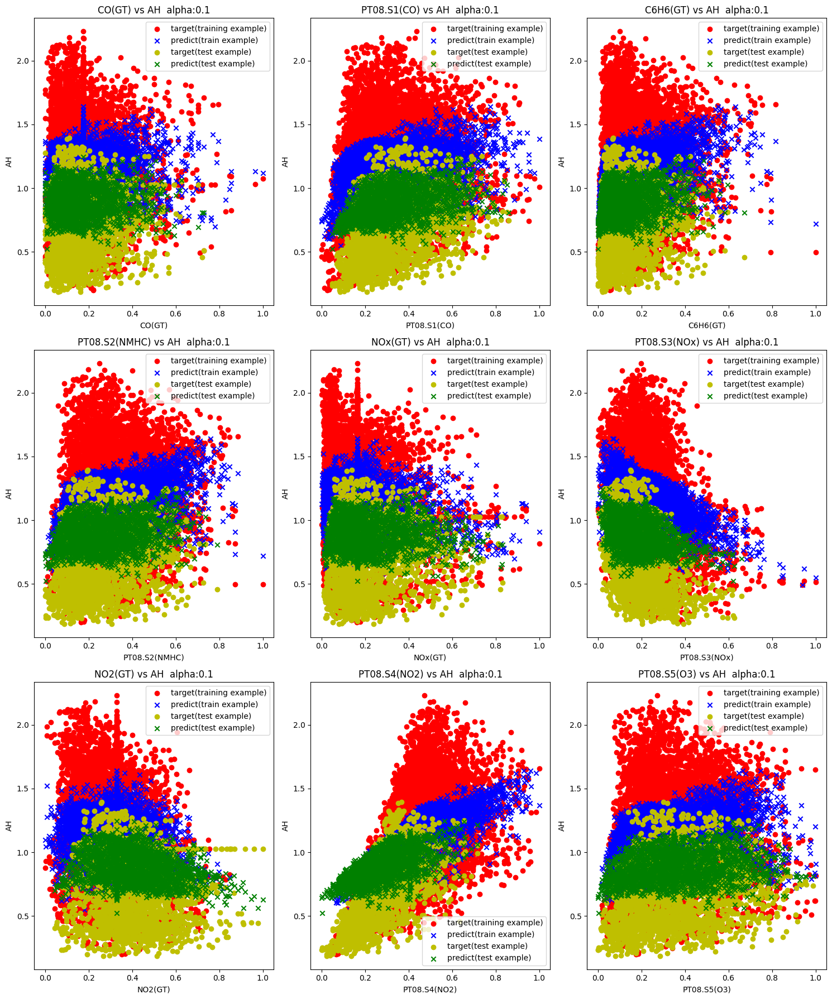

In [118]:
import matplotlib.pyplot as plt
import numpy as np

#x_train, y_train, x_test, and y_test are training and test data
tmp_f_wb_train = np.dot(X_train, w_final) + b_final #ypred
tmp_f_wb_test = np.dot(X_test, w_final) + b_final

features = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
           'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']

# Get the number of features
num_features = len(features)

# Create subplots for each feature
fig, axes = plt.subplots(nrows=(num_features + 2) // 3, ncols=3, figsize=(15, 6 * ((num_features + 2) // 3)))
axes = axes.flatten()

for i in range(num_features):

    # Scatter plot for training set
    axes[i].scatter(X_train[:, i], Y_train, c='r', label='target(training example)')
    axes[i].scatter(X_train[:,i], tmp_f_wb_train, marker='x', c='b', label='predict(train example)')

    # Scatter plot for test set
    axes[i].scatter(X_test[:, i], Y_test, c='y', label='target(test example)')
    axes[i].scatter(X_test[:,i], tmp_f_wb_test, marker='x', c='g', label='predict(test example)')

    # Set title, labels, and legend
    axes[i].set_title(f'{features[i]} vs AH  alpha:{tmp_alpha}')
    axes[i].set_ylabel('AH')
    axes[i].set_xlabel(features[i])
    axes[i].legend()

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()
